# **Clasificación de Imágenes: Redes Convolucionales Profundas con Transfer Learning**
El objetivo de este notebook es crear una red neuronal que permita clasificar imágenes de famosos por género, en sus versiones en escala de gris y a color. Este notebook expandirá sobre arquitecturas ya existentes mediante el *transfer learning*, sumando capas densas de clasificación. Se compararán los resultados de *accuracy* y *loss* obtenidos contra los modelos de los *Notebook* 1 y 2.

Este notebook fue ejecutado utilizando una GPU RTX4070 (Laptop), y por tanto su versión final no ha sido probada en Google Colab, pues el entrenamiento es más rápido y no se dispone de tiempo límite. En este caso, el notebook tiene un total de **1000 epochs** de entrenamiento. Como las redes son entrenadas **desde cero**, no sabemos si estos resultados puedan ser reproducibles en Google Colab.

Los resultados de modelos entrenados pueden diferir de aquellos mostrados en las secciones de visualización. Esto se debe a que antes de entregar los *Notebooks*, reiniciamos la kernel y ejecutamos desde cero, volviendo a randomizar los pesos de los MLP; pero, habiendo conseguido en un primer lugar los mejores resultados,**mantenemos estos en una copia** separada que es cargada al final (si la ejecución actual resulta peor).

Equipo 08:
- Tomás Daniel Expósito Torre
- David Sánz Gomez

## **Imports y Descarga de Datos**
Define los imports a utilizar en el resto del notebook, así como la descarga del fichero *gender.zip* y las funciones auxiliares. Para descargar el fichero, se debe poner la variable local a **False**.

In [1]:
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Gráficos
from matplotlib.ticker import MaxNLocator
from PIL import Image
from IPython.display import SVG
from IPython.display import clear_output
from glob import glob

# Keras
from keras.utils import load_img
from keras.api import Input
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, GlobalAveragePooling2D
from keras.regularizers import L1, L2, L1L2
from keras.optimizers import Adam, RMSprop
from keras.callbacks import ModelCheckpoint
from keras.models import load_model
from keras.utils import model_to_dot
from keras.models import Model
from keras.src.legacy.preprocessing.image import ImageDataGenerator
from keras.layers import Dense, Dropout


# Scikit-Learn
from sklearn.metrics import roc_curve, auc, confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

# Otros modulos
from googledrivedownloader import download_file_from_google_drive
import pandas as pd

E0000 00:00:1736806397.200294   81133 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1736806397.202826   81133 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [2]:
local = True

In [3]:
if not local:
    aux = "'https://drive.usercontent.google.com/download?id=1kD_GKuU2doz3TSNVi45_BbwvDZ2KmEei&export=download&confirm=t&uuid=56f4f47a-291b-4ef9-895f-8886caf14b78'"
    !wget $aux -O ./gender.zip
    !unzip -qq ./gender.zip
    download_file_from_google_drive(file_id='1jifedd49sgZI2ZA6722h9R-mRh2Ciqzp',
                                    dest_path='./caras_aux.py.zip', unzip=True)
    download_file_from_google_drive(file_id='1w6rSNy0mDds1cDNBtbL9U1bkF4PiGCnK',
                                    dest_path='./funciones_auxiliares.py.zip', unzip=True)

from caras_aux import report_base_error
from funciones_auxiliares import analisis_roc, plot_confusion_matrix    

## **Funciones Auxiliares**
Esta sección define una serie de funciones que ayudan a graficar el proceso de entrenamiento de la arquitectura elegida.

In [4]:
def grafica_entrenamiento(tr_acc, val_acc, tr_loss, val_loss, figsize=(10,4)):
    plt.figure(figsize=figsize)
    i = np.argmax(val_acc)
    train_accuracy, validation_accuracy = np.array(tr_acc) * 100, np.array(val_acc) * 100
    train_loss, validation_loss = np.array(tr_loss), np.array(val_loss)
    epochs = len(train_accuracy)
    
    # Accuracy
    ax = plt.subplot(1,2,1)
    plt.plot(np.arange(epochs) + 1, train_accuracy)
    plt.plot(np.arange(epochs) + 1, validation_accuracy)
    plt.plot(i + 1, validation_accuracy[i], 'or')
    
    plt.title('Accuracy del Modelo (%)', fontsize=18)
    plt.ylabel('Accuracy (%)', fontsize=18)
    plt.xlabel('Época', fontsize=18)
    plt.legend(['entrenamiento', 'validación'], loc='upper left')
    ax.xaxis.set_major_locator(MaxNLocator(integer=True))

    # Loss
    plt.subplot(1, 2, 2)
    plt.plot(np.arange(epochs) + 1, train_loss)
    plt.plot(np.arange(epochs) + 1, validation_loss)
    plt.plot(i + 1, validation_loss[i], 'or')
    
    plt.title('Loss del modelo', fontsize=18)
    plt.ylabel('Loss', fontsize=18)
    plt.xlabel('Época', fontsize=18)
    plt.legend(['entrenamiento', 'validación'], loc='upper left')
    ax.xaxis.set_major_locator(MaxNLocator(integer=True))
    
    plt.show()

## **Exploración y Preparación de Datos**
En esta sección se realiza una exploración básica de los datos, así como un preprocesado para poder trabajar con redes neuronales. Para este problema, se hará uso de un conjunto de **test** del **10%** de la muestra, un conjunto de **train** del **63%** y uno de **validación** del **27%**. La separación de las tres muestras se realiza de la misma forma que se menciona en el *Notebook 2*.

In [5]:
females = sorted(glob("./gender/female/*"))
ifemales = sorted(list(set(["_".join(f.split("_")[:-1]) for f in females])))

males = sorted(glob("./gender/male/*"))
imales = sorted(list(set(["_".join(m.split("_")[:-1]) for m in males])))

paths, tags = females + males, ['female'] * len(females) + ['male'] * len(males)
x, y = ifemales + imales, ['female'] * len(ifemales) + ['male'] * len(imales)

In [6]:
xptrain, xptest, yptrain, yptest = train_test_split(x, y, test_size=0.3, random_state=1, stratify=y)
xptrain, xpval, yptrain, ypval = train_test_split(xptrain, yptrain, test_size=0.3, random_state=1, stratify=yptrain)

In [7]:
xtrain, ytrain = [], []
xtest, ytest = [], []
xval, yval = [], []

for x_, y_ in zip(paths, tags):
    name = "_".join(x_.split("_")[:-1])
    X, Y = (xtrain, ytrain) if name in xptrain else (xval, yval) if name in xpval else (xtest, ytest)
    X.append(x_)
    Y.append(y_)

In [8]:
ptrain = pd.DataFrame({"path": xtrain, "class": ytrain})
ptrain[:5]

,path,class
0,./gender/female/Adriana_Lima_0001.jpg,female
1,./gender/female/Ai_Sugiyama_0001.jpg,female
2,./gender/female/Ai_Sugiyama_0002.jpg,female
3,./gender/female/Ai_Sugiyama_0003.jpg,female
4,./gender/female/Ai_Sugiyama_0004.jpg,female


In [9]:
ptest = pd.DataFrame({"path": xtest, "class": ytest})
ptest[:5]

,path,class
0,./gender/female/Adriana_Perez_Navarro_0001.jpg,female
1,./gender/female/Aicha_El_Ouafi_0001.jpg,female
2,./gender/female/Aicha_El_Ouafi_0002.jpg,female
3,./gender/female/Aicha_El_Ouafi_0003.jpg,female
4,./gender/female/Aiysha_Smith_0001.jpg,female


In [10]:
pval = pd.DataFrame({"path": xval, "class": yval})
pval[:5]

,path,class
0,./gender/female/Adelina_Avila_0001.jpg,female
1,./gender/female/Adrianna_Zuzic_0001.jpg,female
2,./gender/female/Afton_Smith_0001.jpg,female
3,./gender/female/Agnes_Bruckner_0001.jpg,female
4,./gender/female/Akiko_Morigami_0001.jpg,female


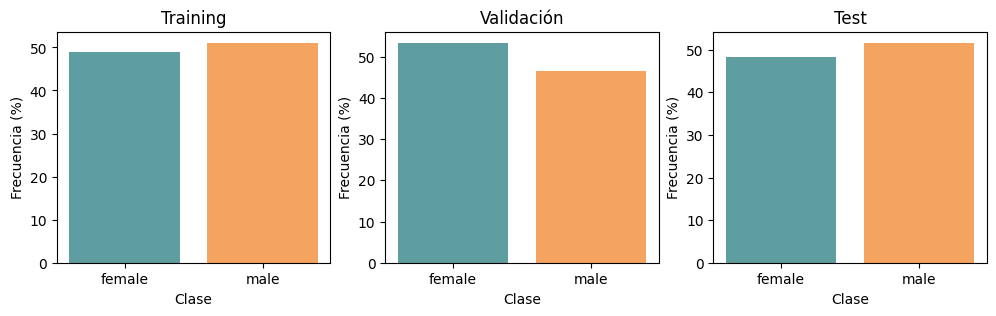

In [11]:
plt.figure(figsize=(12,3))
for i, (y_, title) in enumerate(zip([ptrain, pval, ptest], ['Training', 'Validación', 'Test']), start=1):
    ax = plt.subplot(1,3,i)
    clases, counts = np.unique(y_["class"], return_counts=True)
    plt.bar(clases, counts * 100./len(y_), color=["cadetblue", "sandybrown"])
    plt.title(title)
    plt.xlabel('Clase')
    plt.ylabel('Frecuencia (%)')
    ax.set_xticks(clases)
plt.show();

## **Arquitectura de los Modelos**
En esta sección se definen las dos arquitecturas de clasificación para los modelos de *transfer learning*. En principio, tanto la versión a color como la versión en gris utilizan la misma arquitectura, con el fin de comparar cual dataset es mejor para su clasificación (tratamos la diferencia de canales de imágenes como un parámetro más). El tipo de transfer learning que decidimos utilizar es de *arquitectura*; es decir, no descargar los pesos de imagenet y entrenarlos por nuestra cuenta en las épocas. 

Los modelos que comparamos son los cinco siguientes:
- **Xception**
- **ResNet50**
- **VGG16**
- **InceptionV3**
- **DenseNet201**

Sin embargo, tras realizar las ejecuciones (cuyos resultados serán resumidos más abajo), observamos que el modelo con mayor *accuracy* y menor *loss* es el **InceptionV3**, por lo que es el único que queda especificado en esta sección.

In [12]:
# dimensiones a las que vamos a llevar las imágenes
img_width, img_height = 150, 150
normed_dims = (img_height, img_width)

### **Modelo en Color**

In [13]:
# Modelo final de Transfer-Learning
from keras.applications.inception_v3 import InceptionV3, preprocess_input
base_model = InceptionV3(weights=None, include_top=False, input_shape=normed_dims + (3,))

x = GlobalAveragePooling2D()(base_model.output)

x = Dense(16, activation="relu", kernel_regularizer=L2(0.15))(x)
x = Dense(16, activation="relu", kernel_regularizer=L2(0.1))(x)
x = Dense(8, activation="relu")(x)
x = Dense(2, activation="softmax")(x)

color = Model(base_model.inputs, x)
color.compile(loss='categorical_crossentropy',
              optimizer=RMSprop(),
              metrics=['accuracy'])

I0000 00:00:1736806398.185718   81133 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 5666 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 4070 Laptop GPU, pci bus id: 0000:01:00.0, compute capability: 8.9


In [14]:
color.summary(layer_range=(color.get_layer(index=-5).name, color.get_layer(index=-1).name))

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ global_average_poo… │ (None, 2048)      │          0 │ mixed10[0][0]     │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense (Dense)       │ (None, 16)        │     32,784 │ global_average_p… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_1 (Dense)     │ (None, 16)        │        272 │ dense[0][0]       │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_2 (Dense)     │ (None, 8)         │        136 │ dense_1[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_3 (Dense)     │ (None, 2)         │         18 │ dense_2[0][0]     │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 21,835,994 (83.30 MB)

 Trainable params: 21,801,562 (83.17 MB)

 Non-trainable params: 34,432 (134.50 KB)

### **Modelo en Gris**

In [15]:
base_model = InceptionV3(weights=None, include_top=False, input_shape=normed_dims + (1,))
x = GlobalAveragePooling2D()(base_model.output)

x = Dense(16, activation="relu", kernel_regularizer=L2(0.15))(x)
x = Dense(16, activation="relu", kernel_regularizer=L2(0.1))(x)
x = Dense(8, activation="relu")(x)
x = Dense(2, activation="softmax")(x)

gray = Model(base_model.inputs, x)
gray.compile(loss='categorical_crossentropy',
              optimizer=RMSprop(),
              metrics=['accuracy'])

In [16]:
gray.summary(layer_range=(gray.get_layer(index=-5).name, gray.get_layer(index=-1).name))

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ global_average_poo… │ (None, 2048)      │          0 │ mixed10[0][0]     │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_4 (Dense)     │ (None, 16)        │     32,784 │ global_average_p… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_5 (Dense)     │ (None, 16)        │        272 │ dense_4[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_6 (Dense)     │ (None, 8)         │        136 │ dense_5[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_7 (Dense)     │ (None, 2)         │         18 │ dense_6[0][0]     │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 21,835,418 (83.30 MB)

 Trainable params: 21,800,986 (83.16 MB)

 Non-trainable params: 34,432 (134.50 KB)

## **Entrenamiento del modelo**

En esta sección realizaremos el entrenamiento de la red definida arriba, con varias transformaciones a las imagenes originales para evitar sesgos. El criterio utilizado para definir la mejor época es aquella que minimice el *loss*, es decir, cuan seguro está el modelo de sus predicciones. Hemos probado todas las redes pre-entrenadas para *feature* extraction, como se mencionó en la sección anterior.

Sobre sus diferentes resultados, el mejor caso que hemos observado en color es de una *acuracy* de **0.947** para el modelo InceptionV3 (200 epochs) con una loss de **0.17**. Esta ha llegado a subir a un máximo de **0.953** en un caso (400 epochs), pero hemos decidido no utilziar este resultado debido al alto *loss* resultante, de **0.63**. Para la versión en gris, en cambio, logramos un valor de **0.957** para una *loss* de **0.21** en validación, pero nos quedamos con el par **0.95/0.17** en su lugar.

Al estar inicializando los pesos aleatoriamente, notamos como el modelo, independientemente de la regularización que implementemos (preferimos L2 porque L1 y L1L2 fué demasiado agresiva, muchas veces no superando el **0.5** de *accuracy*) hay overfit hacia el conjunto de entrenamiento, cuya accuracy tiende al 100%. Sin embargo, los resultados que obtenemos son mejores que fijar los pesos y entrenar solo clasificación, donde suelen quedarse en la barrera del **0.9**. El mejor caso de estos fue para DeepNet201, con una *accuracy* de **0.915**.

In [17]:
train_datagen = ImageDataGenerator(
    dtype='float32',
    preprocessing_function=preprocess_input ,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    fill_mode='nearest',
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True
)

val_datagen  = ImageDataGenerator(dtype='float32', preprocessing_function=preprocess_input)
test_datagen = ImageDataGenerator(dtype='float32', preprocessing_function=preprocess_input)

### **Modelo en Color**

In [18]:
batch_size = 32

train_color = train_datagen.flow_from_dataframe(
    dataframe=ptrain, x_col="path", y_col="class",
    target_size=normed_dims, batch_size=batch_size,
    shuffle=True,
    class_mode='categorical')

validation_color = val_datagen.flow_from_dataframe(
    dataframe=pval, x_col="path", y_col="class",
    target_size=normed_dims, batch_size=batch_size,
    shuffle=False,
    class_mode='categorical')

test_color = test_datagen.flow_from_dataframe(
    dataframe=ptest, x_col="path", y_col="class",
    target_size=normed_dims, batch_size=batch_size,
    shuffle=False,
    class_mode='categorical') # binary, categorical, sparse

Found 1057 validated image filenames belonging to 2 classes.
Found 455 validated image filenames belonging to 2 classes.
Found 641 validated image filenames belonging to 2 classes.


In [19]:
epochs = 500
checkpoint = ModelCheckpoint("best_cnntl_color.keras", monitor='val_loss', verbose=0, save_best_only=True, mode='min') 

atr, aval = [], []
ltr, lval = [], []

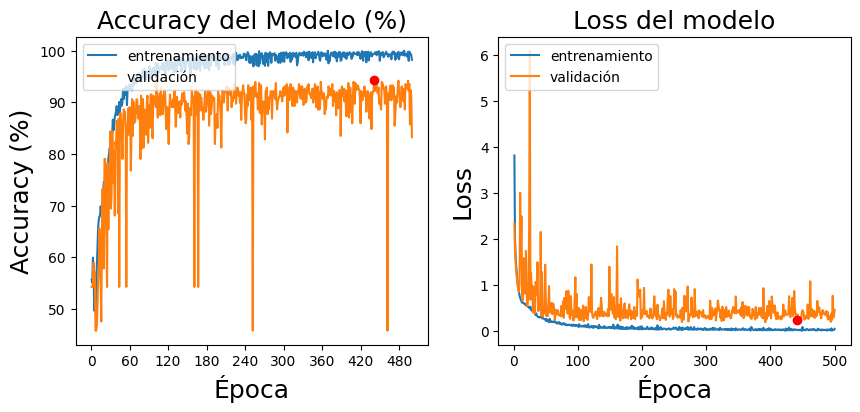

In [20]:
for e in range(epochs):
    salida = color.fit(train_color,
                       steps_per_epoch=train_color.n // batch_size,
                       epochs=1,
                       callbacks=[checkpoint],
                       verbose=0,
                       shuffle = True,
                       validation_data=validation_color,
                       validation_steps=validation_color.n // batch_size
                      )

    atr.append(salida.history["accuracy"][0])
    aval.append(salida.history["val_accuracy"][0])
    ltr.append(salida.history["loss"][0])
    lval.append(salida.history["val_loss"][0])

    clear_output()
    grafica_entrenamiento(atr, aval, ltr, lval)

In [21]:
print(f"Mejor Accuracy: acc={aval[np.argmax(aval)]}, loss={lval[np.argmax(aval)]}")
print(f"Mejor Loss: acc={aval[np.argmin(lval)]}, loss={lval[np.argmin(lval)]}")

Mejor Accuracy: acc=0.9441964030265808, loss=0.2497987300157547
Mejor Loss: acc=0.9241071343421936, loss=0.1942199468612671


In [22]:
try:
    prev_model = load_model("N3E08_color.keras")
    color = load_model("best_cnntl_color.keras")
    pl, pa = prev_model.evaluate(validation_color)
    l, a = color.evaluate(validation_color)
    
    print("Previous model found, comparing obtained scores...")
    if (a-l) > (pa-pl):
        print(f"New model is better ({a},{l} vs {pa}, {pl}), saving...")
        color.save("N3E08_color.keras")
    else:
        print(f"Old model is better ({a},{l} vs {pa}, {pl}), skipping save...")
        color = prev_model
        
except Exception as _:
    print("No previous model found, saving...")
    color = load_model("best_cnntl_color.keras")
    color.save("N3E08_color.keras")
    

15/15 ━━━━━━━━━━━━━━━━━━━━ 7s 273ms/step - accuracy: 0.8982 - loss: 0.2464
15/15 ━━━━━━━━━━━━━━━━━━━━ 4s 101ms/step - accuracy: 0.8988 - loss: 0.2235
Previous model found, comparing obtained scores...
New model is better (0.9252747297286987,0.19180244207382202 vs 0.9164835214614868, 0.22060878574848175), saving...


### **Modelo en Gris**

In [23]:
batch_size = 32

train_gray = train_datagen.flow_from_dataframe(
    dataframe=ptrain, x_col="path", y_col="class",
    target_size=normed_dims, batch_size=batch_size,
    shuffle=True,
    color_mode="grayscale",
    class_mode='categorical')

validation_gray = val_datagen.flow_from_dataframe(
    dataframe=pval, x_col="path", y_col="class",
    target_size=normed_dims, batch_size=batch_size,
    shuffle=False,
    color_mode="grayscale",
    class_mode='categorical')

test_gray = test_datagen.flow_from_dataframe(
    dataframe=ptest, x_col="path", y_col="class",
    target_size=normed_dims, batch_size=batch_size,
    shuffle=False,
    color_mode="grayscale",
    class_mode='categorical') # binary, categorical, sparse

Found 1057 validated image filenames belonging to 2 classes.
Found 455 validated image filenames belonging to 2 classes.
Found 641 validated image filenames belonging to 2 classes.


In [24]:
epochs = 500
checkpoint = ModelCheckpoint("best_cnntl_gray.keras", monitor='val_loss', verbose=0, save_best_only=True, mode='min') 

atr, aval = [], []
ltr, lval = [], []

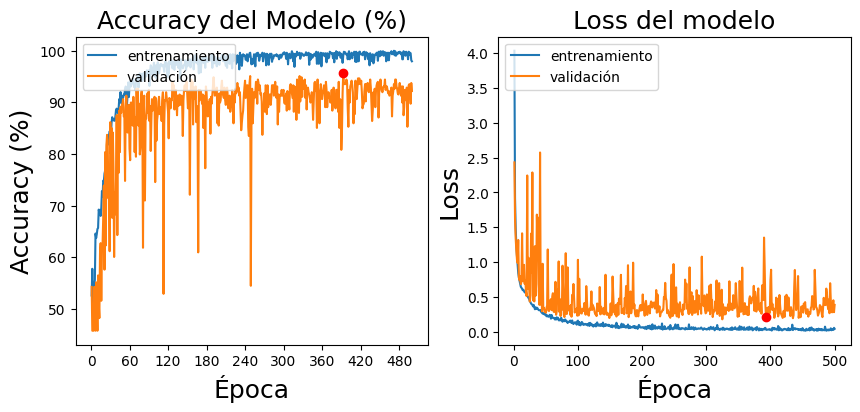

In [25]:
for e in range(epochs):
    salida = gray.fit(train_gray,
                       steps_per_epoch=train_gray.n // batch_size,
                       epochs=1,
                       callbacks=[checkpoint],
                       verbose=0,
                       shuffle = True,
                       validation_data=validation_gray,
                       validation_steps=validation_gray.n // batch_size
                      )

    atr.append(salida.history["accuracy"][0])
    aval.append(salida.history["val_accuracy"][0])
    ltr.append(salida.history["loss"][0])
    lval.append(salida.history["val_loss"][0])

    clear_output()
    grafica_entrenamiento(atr, aval, ltr, lval)

In [26]:
print(f"Mejor Accuracy: acc={aval[np.argmax(aval)]}, loss={lval[np.argmax(aval)]}")
print(f"Mejor Loss: acc={aval[np.argmin(lval)]}, loss={lval[np.argmin(lval)]}")

Mejor Accuracy: acc=0.9575892686843872, loss=0.21506810188293457
Mejor Loss: acc=0.9508928656578064, loss=0.17678236961364746


In [27]:
try:
    prev_model = load_model("N3E08_gray.keras")
    gray = load_model("best_cnntl_gray.keras")
    pl, pa = prev_model.evaluate(validation_gray)
    l, a = gray.evaluate(validation_gray)
    
    print("Previous model found, comparing obtained scores...")
    if (a-l) > (pa-pl):
        print(f"New model is better ({a},{l} vs {pa}, {pl}), saving...")
        gray.save("N3E08_gray.keras")
    else:
        print(f"Old model is better ({a},{l} vs {pa}, {pl}) skipping save...")
        gray = prev_model
        
except Exception as _:
    print("No previous model found, saving...")
    gray = load_model("best_cnntl_gray.keras")
    gray.save("N3E08_gray.keras")
    

No previous model found, saving...


## **Análisis de los resultados del modelo**
En esta sección comprenderemos los *scores* obtenidos por nuestro mejor modelo en comparación a aquellos explorados en el N1E08 y N2E08. También, se resume una tabla de resultados obtenidos con el resto de modelos probados de *Keras Applications* a modo de resumen final. En forma de resumen, los resultados obtenidos son:

**Regresión Logística (gris)**
- 80.7% de accuracy en validación.
- 78% de accuracy en test.
- TPR de aproximadamente 0.73 para un FPR de 0.2 en la curva ROC.
- Area bajo la curva de 0.865

**Red Densa (gris)**
- 81.8% de accuracy en validación.
- 78% de accuracy en test.
- TPR de aproximadamente 0.75 para un FPR de 0.2 en la curva ROC.
- Area bajo la curva de 0.868

**Red Convolucional Profunda (color)** 
- 85.9% de accuracy en validación. **(+4.1%)**
- 86.1% de accuracy en test. **(+8.1%)**
- TPR de aproximadamente 0.9 para un FPR de 0.2 en la curva ROC, y un area bajo la curva de 0.94. **(+0.15)**
- Area bajo la curva de 0.94 **(+0.084)**

**Red Convolucional Profunda con Transfer Learning (gris)** 
- 95% de accuracy en validación. **(+9.1%)**
- 92.4% de accuracy en test. **(+6.3%)**
- TPR de aproximadamente 0.97 para un FPR de 0.2 en la curva ROC, y un area bajo la curva de 0.94. **(+0.07)**
- Area bajo la curva de 0.98 **(+0.04)**

Evidentemente, los resultados al utilizar *transfer learning* volvieron a mejorar de manera significativa. El único problema que vemos con esto es haber tenido que entrenar la red desde cero en lugar de haber aprovechado el conjunto de pesos original. Sin embargo, esto era inevitable en el modelo en gris, ya que los MLP estaban entrenados para clasificar imágenes de tres canales.

In [28]:
color_loss, color_accuracy = color.evaluate(validation_color)
tmp_loss, tmp_accuracy = color.evaluate(test_color)

color_loss = (color_loss + tmp_loss) / 2
color_accuracy = (color_accuracy + tmp_accuracy) / 2

gray_loss, gray_accuracy = gray.evaluate(validation_gray)
tmp_loss, tmp_accuracy = gray.evaluate(test_gray)

gray_loss = (gray_loss + tmp_loss) / 2
gray_accuracy = (gray_accuracy + tmp_accuracy) / 2

if color_accuracy - color_loss > gray_accuracy - gray_loss:
    print("Mejor modelo: Color")
    best = color
    train_best, validation_best, test_best = train_color, validation_color, test_color
else:
    print("Mejor modelo: Gris")
    best = gray
    train_best, validation_best, test_best = train_gray, validation_gray, test_gray

15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - accuracy: 0.8988 - loss: 0.2235
21/21 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - accuracy: 0.9473 - loss: 0.2009
15/15 ━━━━━━━━━━━━━━━━━━━━ 4s 115ms/step - accuracy: 0.9558 - loss: 0.1558
21/21 ━━━━━━━━━━━━━━━━━━━━ 2s 78ms/step - accuracy: 0.9618 - loss: 0.1683
Mejor modelo: Gris


In [29]:
scores_tr = best.evaluate(train_best)
print('Train loss    :', scores_tr[0])
print('Train accuracy:', scores_tr[1])
print()

scores_val = best.evaluate(validation_best)
print('Val loss    :', scores_val[0])
print('Val accuracy:', scores_val[1])
print()

scores_te = best.evaluate(test_best)
print('Test loss     :', scores_te[0])
print('Test accuracy :', scores_te[1])

34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - accuracy: 0.9695 - loss: 0.0908
Train loss    : 0.10153831541538239
Train accuracy: 0.9678335189819336

15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - accuracy: 0.9558 - loss: 0.1558
Val loss    : 0.17724785208702087
Val accuracy: 0.9494505524635315

21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.9618 - loss: 0.1683
Test loss     : 0.30495691299438477
Test accuracy : 0.925117015838623


In [30]:
from sklearn.metrics import classification_report, roc_curve, auc

y_real = np.array(test_best.classes)
y_pred_proba = best.predict(test_best)
y_pred = np.argmax(y_pred_proba, axis=1)
print('')
print(classification_report(y_real, y_pred))

21/21 ━━━━━━━━━━━━━━━━━━━━ 5s 120ms/step

              precision    recall  f1-score   support

           0       0.88      0.98      0.93       310
           1       0.98      0.88      0.92       331

    accuracy                           0.93       641
   macro avg       0.93      0.93      0.93       641
weighted avg       0.93      0.93      0.93       641



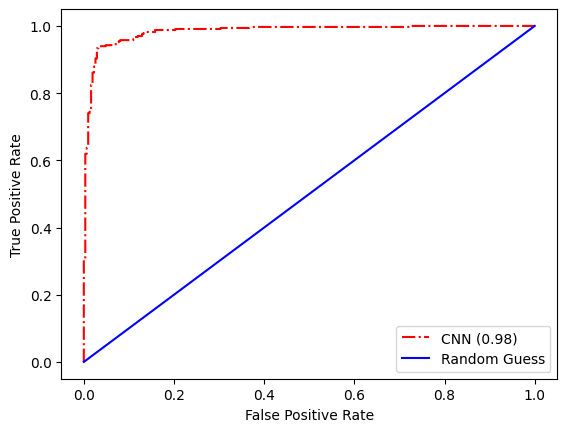

In [31]:
clase_positiva = 1
fpr, tpr, thresholds = roc_curve(y_real==clase_positiva, y_pred_proba[:,clase_positiva])
fig, ax1 = plt.subplots(1,1)
ax1.plot(fpr, tpr, 'r-.', label = 'CNN (%2.2f)' % auc(fpr, tpr))
ax1.set_xlabel('False Positive Rate')
ax1.set_ylabel('True Positive Rate')
ax1.plot(fpr, fpr, 'b-', label = 'Random Guess')
ax1.legend();

In [32]:
data = {
    'Model': ['InceptionV3 (Trainable)', 'DenseNet 201 (Trainable)', 'InceptionV3 (Non-trainable)', 'DenseNet 201 (Non-trainable)', 'ResNet50', 'VGG16', 'Mejor Guardado'],
    'Score': [0.947, 0.928, 0.915, 0.89, 0.84, 0.81, (scores_val[1]+scores_te[1])/2.],
    'Loss': ['0.17', '0.25', '0.27', '0.3', '> 0.3', '> 0.3', (scores_val[0]+scores_te[0])/2.] 
}

# Create a DataFrame
pd.DataFrame(data)

,Model,Score,Loss
0,InceptionV3 (Trainable),0.947000,0.17
1,DenseNet 201 (Trainable),0.928000,0.25
2,InceptionV3 (Non-trainable),0.915000,0.27
3,DenseNet 201 (Non-trainable),0.890000,0.3
4,ResNet50,0.840000,> 0.3
5,VGG16,0.810000,> 0.3
6,Mejor Guardado,0.937284,0.241102


## **Visualización de ejemplos de test**

En esta sección veremos como el mejor modelo intenta clasificar un ejemplo simple del conjunto de test. En este caso, adivina correctamente la clase y lo hace con una certeza de **100.0%**. Aunque la imagen no se muestre de forma correcta, es la misma que en el *Notebook 1*, cuyo resultado era efectivamente *female*.

In [33]:
test_datagen2 = ImageDataGenerator(dtype='float32', preprocessing_function=preprocess_input)

if best == color:
    test_generator2 = test_datagen2.flow_from_dataframe(
        dataframe=ptest,
        x_col="path",
        y_col="class",
        target_size=normed_dims,
        batch_size=test_color.n, # todas las imágenes del directorio test
        shuffle=False,
        class_mode='categorical')
else:
        test_generator2 = test_datagen2.flow_from_dataframe(
        dataframe=ptest,
        x_col="path",
        y_col="class",
        target_size=normed_dims,
        batch_size=test_color.n, # todas las imágenes del directorio test
        shuffle=False,
        color_mode="grayscale",
        class_mode='categorical')

Found 641 validated image filenames belonging to 2 classes.


In [34]:
test_generator2.reset()
X_te, y_te = next(test_generator2)
class_indices = test_generator2.class_indices
class_indices

{'female': 0, 'male': 1}

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
Probabilidad female: 100.0%
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
Probabilidad male : 0.0%


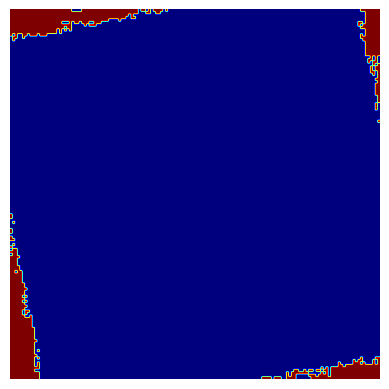

In [35]:
ind_te1 = 0

image = X_te[ind_te1].copy()

plt.imshow(image.astype('uint8'), cmap='jet')
plt.axis("off")
p = best.predict(np.expand_dims(image, axis=0))[0][class_indices["female"]]
print("Probabilidad female: {:2.1f}%".format(100*p))
p = best.predict(np.expand_dims(image, axis=0))[0][class_indices["male"]]
print("Probabilidad male : {:2.1f}%".format(100*p))

## **Visualización del funcionamiento de la red**

En esta sección se explora el funcionamiento de la red, en varias de sus capas convolucionales, y utilizando *heatmaps* para ver regiones de foco a la hora de clasificar.

### **Feature Maps**

In [36]:
ejemplo = 0

# Now we extract the outputs of the top 6 layers:
layer_outputs = [layer.output for layer in best.layers[:6]]
# Creates a model that will return these outputs, given the model input:
activation_model = Model(inputs=best.input, outputs=layer_outputs)

activations = activation_model.predict(X_te[ejemplo:(ejemplo+1)])

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


/tmp/ipykernel_81133/1414986441.py:44: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  plt.imshow(display_grid, aspect='auto', cmap='viridis')
/home/tomas/venv/lib/python3.12/site-packages/matplotlib/_tight_bbox.py:67: RuntimeWarning: divide by zero encountered in scalar divide
  fig.patch.set_bounds(x0 / w1, y0 / h1,
/home/tomas/venv/lib/python3.12/site-packages/matplotlib/_tight_bbox.py:68: RuntimeWarning: divide by zero encountered in scalar divide
  fig.bbox.width / w1, fig.bbox.height / h1)
/home/tomas/venv/lib/python3.12/site-packages/matplotlib/patches.py:787: RuntimeWarning: invalid value encountered in scalar add
  y1 = self.convert_yunits(self._y0 + self._height)
/home/tomas/venv/lib/python3.12/site-packages/matplotlib/transforms.py:2049: RuntimeWarning: invalid value encountered in scalar add
  self._mtx[1, 2] += ty


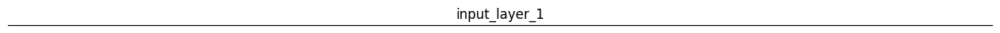

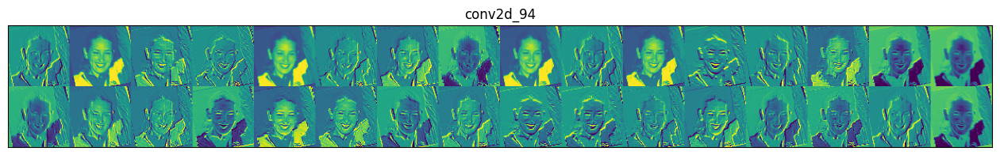

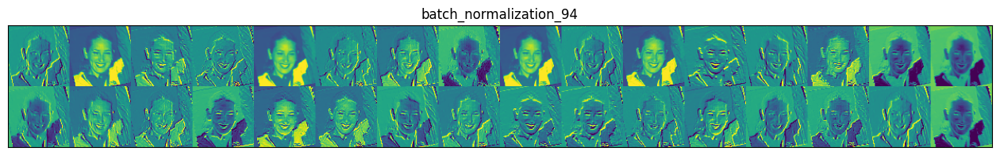

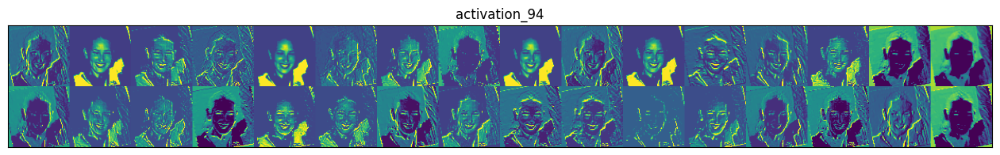

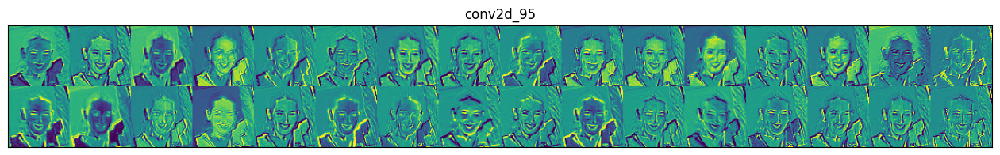

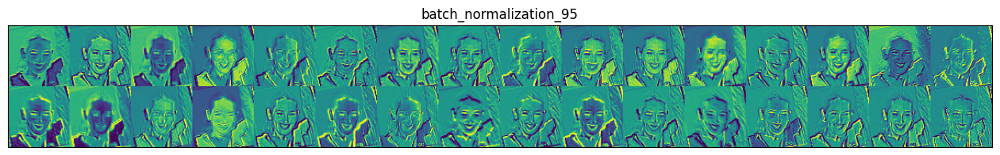

In [37]:
# These are the names of the layers, so can have them as part of our plot
layer_names = []
for layer in best.layers[:8]:
    layer_names.append(layer.name)

images_per_row = 16

# Now let's display our feature maps
for layer_name, layer_activation in zip(layer_names, activations):
    # This is the number of features in the feature map
    n_features = layer_activation.shape[-1]

    # The feature map has shape (1, size, size, n_features)
    size = layer_activation.shape[1]

    # We will tile the activation channels in this matrix
    n_cols = n_features // images_per_row
    display_grid = np.zeros((size * n_cols, images_per_row * size))

    # We'll tile each filter into this big horizontal grid
    for col in range(n_cols):
        for row in range(images_per_row):
            channel_image = layer_activation[0,
                                             :, :,
                                             col * images_per_row + row]
            # Post-process the feature to make it visually palatable
            channel_image -= channel_image.mean()
            if channel_image.std() != 0:
                channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size : (col + 1) * size,
                         row * size : (row + 1) * size] = channel_image

    # Display the grid
    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1],
                        scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(display_grid, aspect='auto', cmap='viridis')

### **¿A qué partes de la imagen de entrada es más sensible la salida de la red?**

De la forma en la que entrenamos las redes en este notebook, no podemos decir realmente en que zonas se centra a la hora de realizar la clasificación. Teorizamos que esto se debe a varias razones:
1. **Pesos.** Solo mantenemos la arquitectura de la red original InceptionV3, por tanto no descargamos los pesos y re-entrenamos el modelo. Eso quiere decir que, en lugar de estar optimizado para reconocer ciertas partes de las imágenes como el modelo original, tenemos una arquitectura de 48 capas de *feature extraction* mucho más compleja que la usada en el Notebook 2 (~6-8 capas)
2. **Preprocessing.** Desconocemos lo que realiza la función preprocess_input importada desde Keras. Por tanto, le atribuímos menos importancia a los cambios en comparación con el punto anterior, pero es evidente que no es una normalización x/255 (sino las imágenes de heatmaps se verían igual que en el notebook anterior).


In [38]:
import tensorflow as tf
import cv2
from tensorflow.keras import backend as K

def find_ind_last_conv2D(model):
    ind_last_conv2D_layer = None
    for i,x in enumerate(model.layers):
        if x.__class__.__name__ == "Conv2D":
            ind_last_conv2D_layer = i
    return ind_last_conv2D_layer


def show_heatmap(model, im, heatmap_factor=0.5, cmap=cv2.COLORMAP_HOT):
    imag = np.expand_dims(im, axis=0) # de 1 imagen pasamos a 1 conjunto de 1 imagen

    # The is the output feature map of the last convolutional layer
    last_conv_layer = model.layers[find_ind_last_conv2D(model)]

    # This is the gradient of the "benign" class with regard to
    # the output feature map of last convolutional layer
    with tf.GradientTape() as tape:
        aux = model.output
        #aux = model.layers[-2].output # salida de la última capa densa antes de softmax

        iterate = tf.keras.models.Model([model.inputs], [aux, last_conv_layer.output])
        model_out, last_conv_layer = iterate(imag)
        class_out = model_out[:, np.argmax(model_out[0])]
        grads = tape.gradient(class_out, last_conv_layer)

        # mean intensity of the gradient over a specific feature map channel:
        pooled_grads = K.mean(grads, axis=(0, 1, 2))

    heatmap = tf.reduce_mean(tf.multiply(pooled_grads, last_conv_layer), axis=-1)
    heatmap = np.maximum(heatmap, 0) # se quitan los negativos (se ponen a 0)
    heatmap /= np.max(heatmap) # se normaliza entre 0 y 1
    heatmap = heatmap[0] # pasamos de 1 conjunto de 1 heatmap a 1 heatmap

    img = imag[0]

    img = np.zeros((im.shape[0],im.shape[1],3))
    for i in range(3):
        img[:,:,i] = imag[0,:,:,0]


    # We resize the heatmap to have the same size as the original image
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))

    # We convert the heatmap to RGB
    heatmap = np.uint8(255 * heatmap)

    # We apply the heatmap to the original image
    heatmap = cv2.applyColorMap(heatmap, cmap) / 255


    im2 = (im - im.min()) / (im.max() - im.min())
    superimposed_img = (1-heatmap_factor)*im2 + heatmap_factor*heatmap

    plt.figure(figsize=(15,5))
    plt.subplot(1,3,1)
    plt.imshow(im2, vmin=0, vmax=1); plt.xticks([]); plt.yticks([])
    plt.subplot(1,3,2)
    plt.imshow(heatmap, vmin=0, vmax=1); plt.xticks([]); plt.yticks([])
    plt.subplot(1,3,3)
    plt.imshow(superimposed_img, vmin=0, vmax=1); plt.xticks([]); plt.yticks([])
    plt.show()
    prob = 100*model.predict(imag)[0][class_indices["female"]]
    print("Probabilidad clase female : {:2.1f}%".format(prob))
    prob = 100*model.predict(imag)[0][class_indices["male"]]
    print("Probabilidad clase male: {:2.1f}%".format(prob))
    print("\n\n")
    return heatmap, superimposed_img

**Visualización de mapas de sensibilidades (heatmaps) en varios ejemplos:**

/home/tomas/venv/lib/python3.12/site-packages/keras/src/models/functional.py:238: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: [['input_layer_1']]
Received: inputs=Tensor(shape=(1, 150, 150, 1))
  warnings.warn(msg)


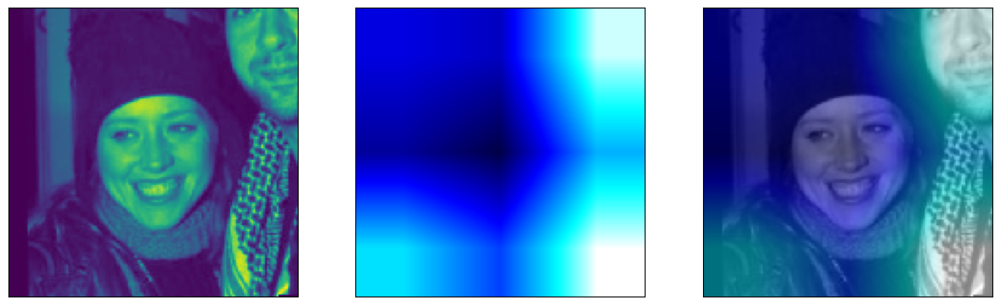

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
Probabilidad clase female : 100.0%
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
Probabilidad clase male: 0.0%





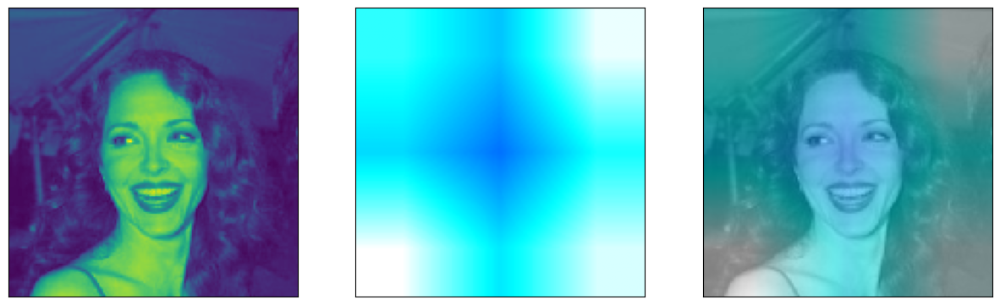

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
Probabilidad clase female : 100.0%
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
Probabilidad clase male: 0.0%





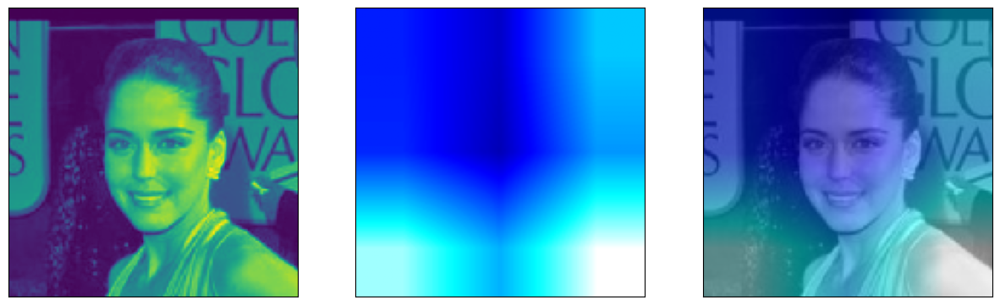

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
Probabilidad clase female : 100.0%
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
Probabilidad clase male: 0.0%





/tmp/ipykernel_81133/56621792.py:35: RuntimeWarning: invalid value encountered in divide
  heatmap /= np.max(heatmap) # se normaliza entre 0 y 1
/tmp/ipykernel_81133/56621792.py:49: RuntimeWarning: invalid value encountered in cast
  heatmap = np.uint8(255 * heatmap)


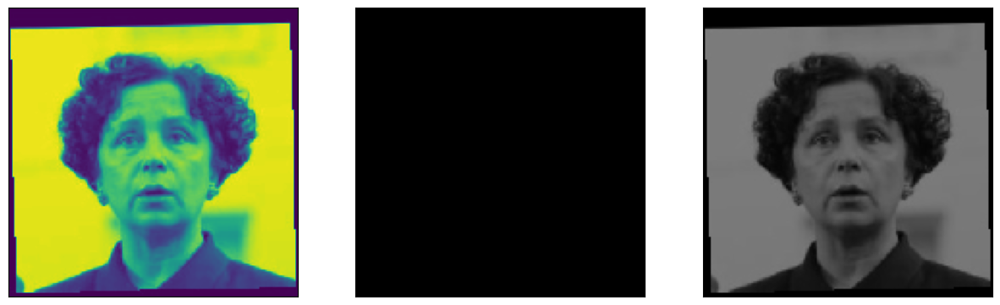

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
Probabilidad clase female : 99.1%
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
Probabilidad clase male: 0.9%





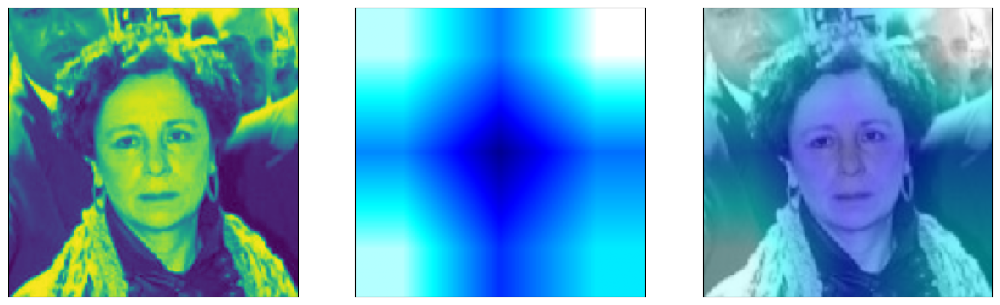

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
Probabilidad clase female : 100.0%
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
Probabilidad clase male: 0.0%





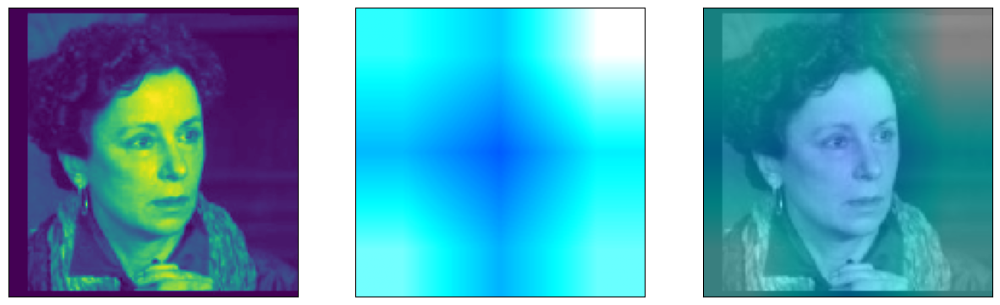

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
Probabilidad clase female : 100.0%
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
Probabilidad clase male: 0.0%





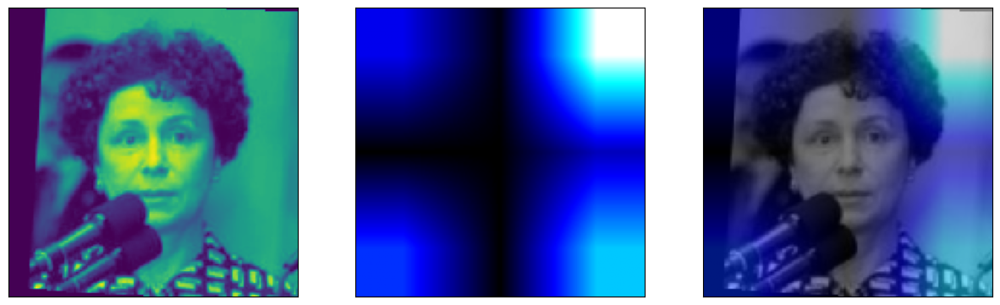

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
Probabilidad clase female : 99.9%
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
Probabilidad clase male: 0.1%





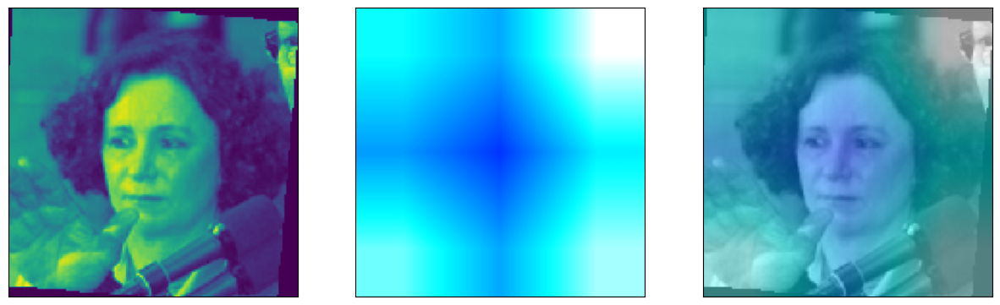

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
Probabilidad clase female : 100.0%
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
Probabilidad clase male: 0.0%





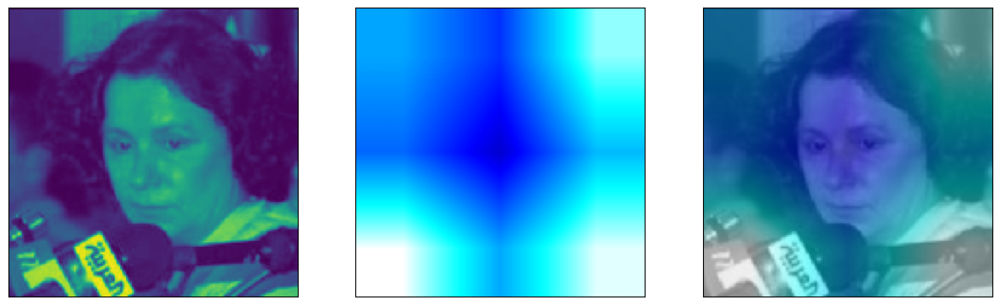

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
Probabilidad clase female : 100.0%
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
Probabilidad clase male: 0.0%





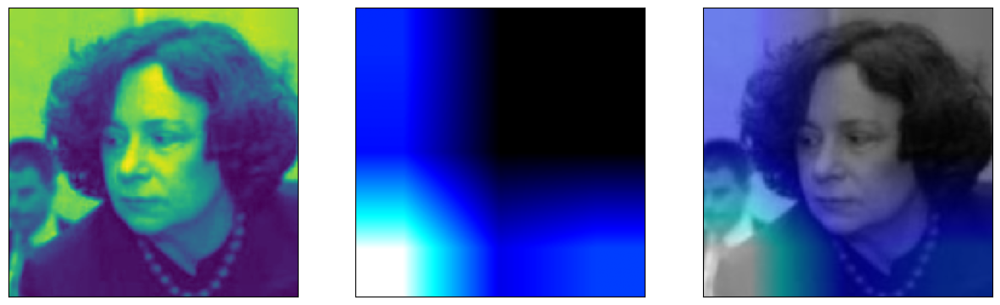

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
Probabilidad clase female : 100.0%
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
Probabilidad clase male: 0.0%





In [39]:
ind = 20

if best == color:
    for i in range(ind, ind+10):
        show_heatmap(color, X_te[i])
else:
    for i in range(ind, ind+10):
        show_heatmap(gray, X_te[i])

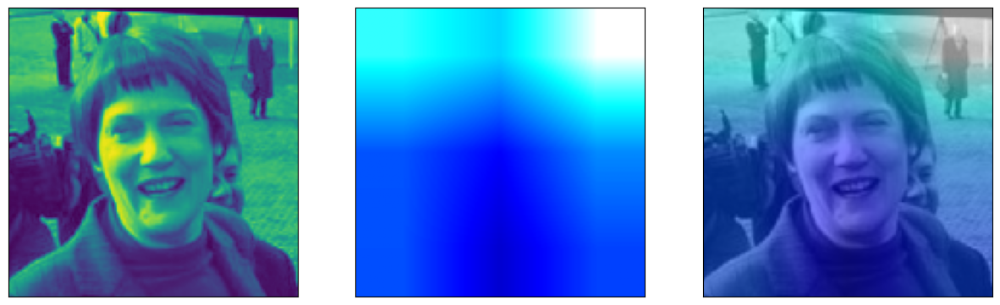

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
Probabilidad clase female : 100.0%
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
Probabilidad clase male: 0.0%





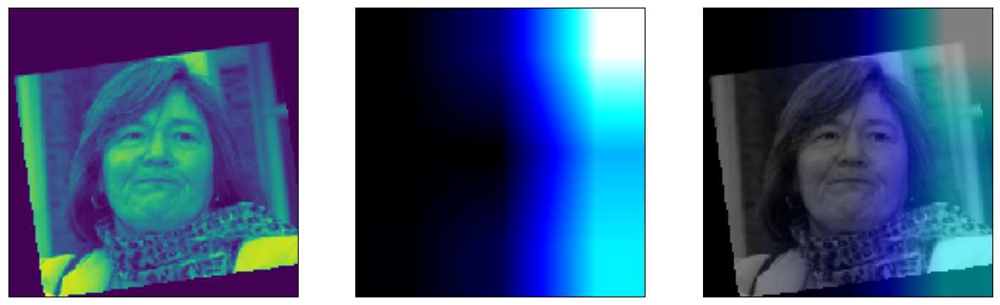

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
Probabilidad clase female : 100.0%
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
Probabilidad clase male: 0.0%





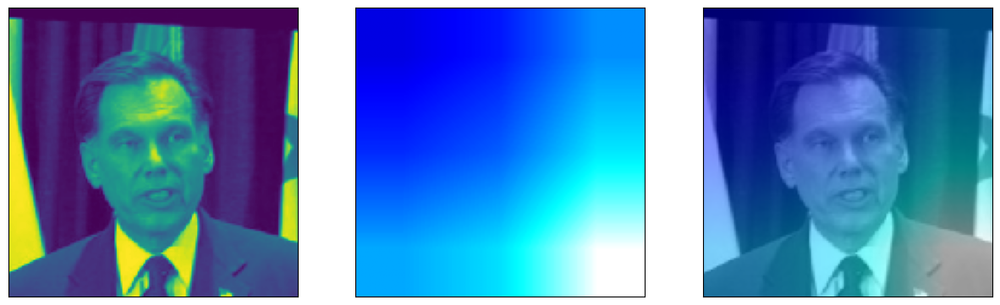

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
Probabilidad clase female : 0.1%
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
Probabilidad clase male: 99.9%





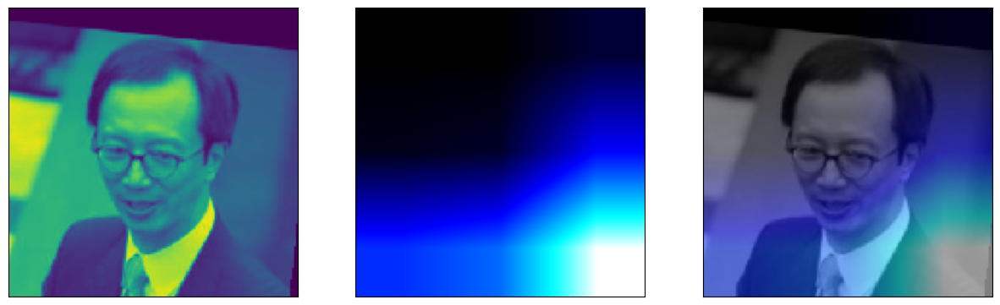

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
Probabilidad clase female : 0.8%
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
Probabilidad clase male: 99.2%





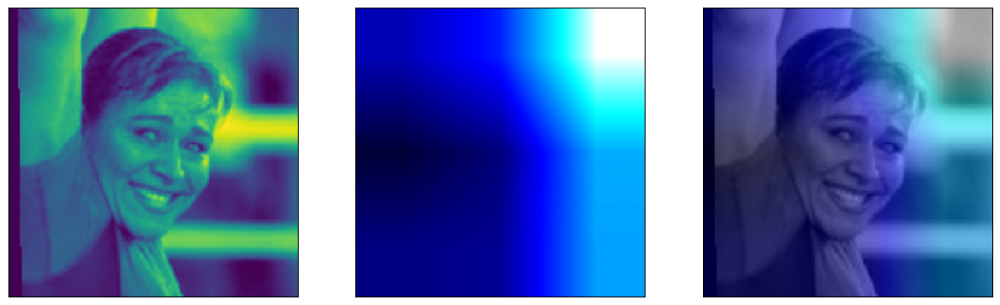

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
Probabilidad clase female : 100.0%
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
Probabilidad clase male: 0.0%





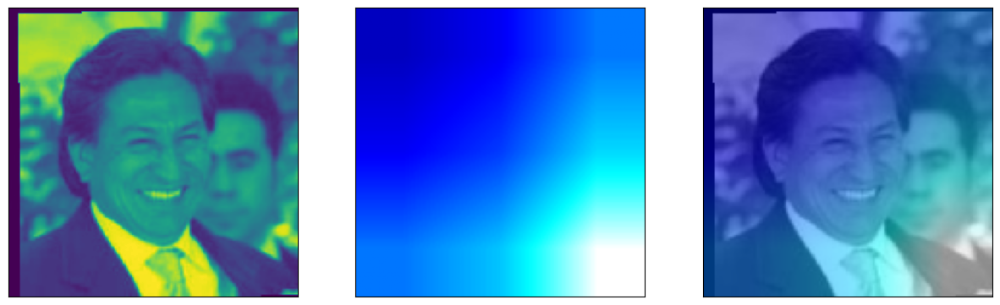

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
Probabilidad clase female : 0.1%
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
Probabilidad clase male: 99.9%





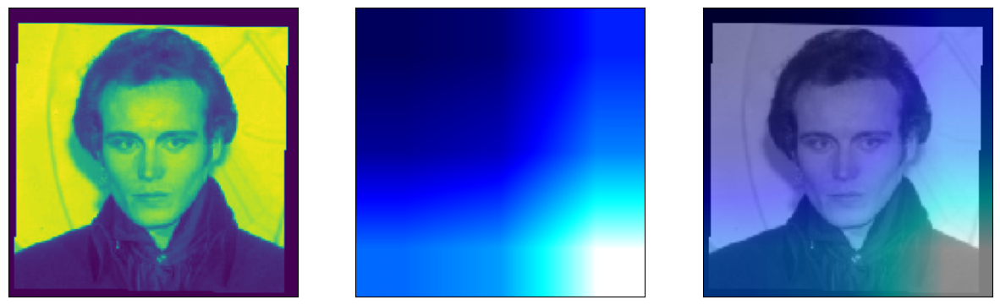

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
Probabilidad clase female : 0.5%
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
Probabilidad clase male: 99.5%





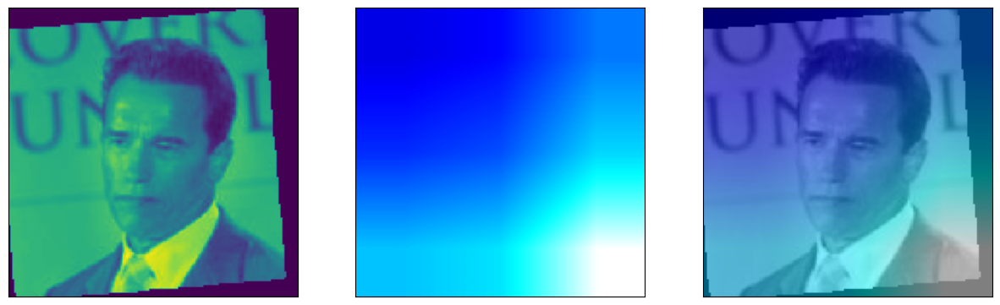

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
Probabilidad clase female : 0.1%
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
Probabilidad clase male: 99.9%





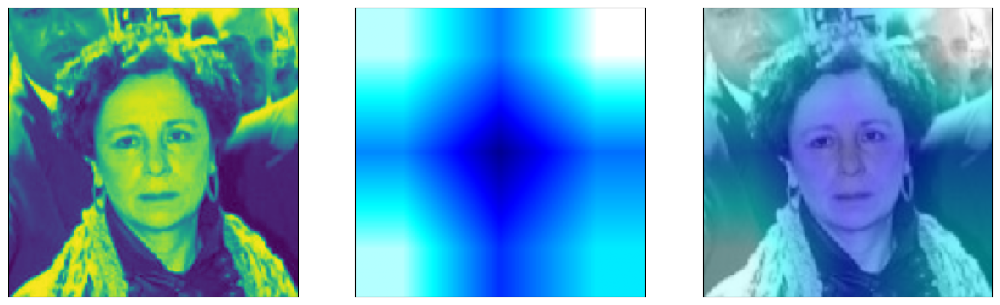

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
Probabilidad clase female : 100.0%
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
Probabilidad clase male: 0.0%





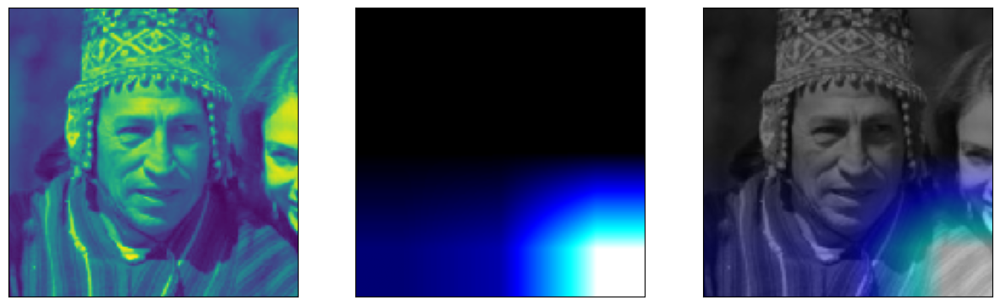

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
Probabilidad clase female : 2.5%
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
Probabilidad clase male: 97.5%





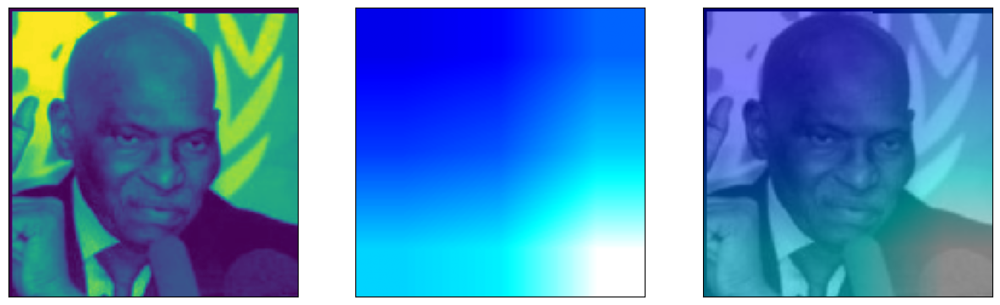

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
Probabilidad clase female : 0.1%
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
Probabilidad clase male: 99.9%





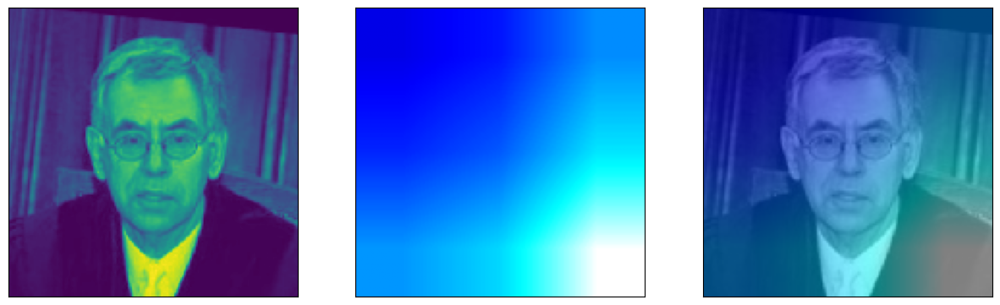

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
Probabilidad clase female : 0.1%
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
Probabilidad clase male: 99.9%





/tmp/ipykernel_81133/56621792.py:35: RuntimeWarning: invalid value encountered in divide
  heatmap /= np.max(heatmap) # se normaliza entre 0 y 1
/tmp/ipykernel_81133/56621792.py:49: RuntimeWarning: invalid value encountered in cast
  heatmap = np.uint8(255 * heatmap)


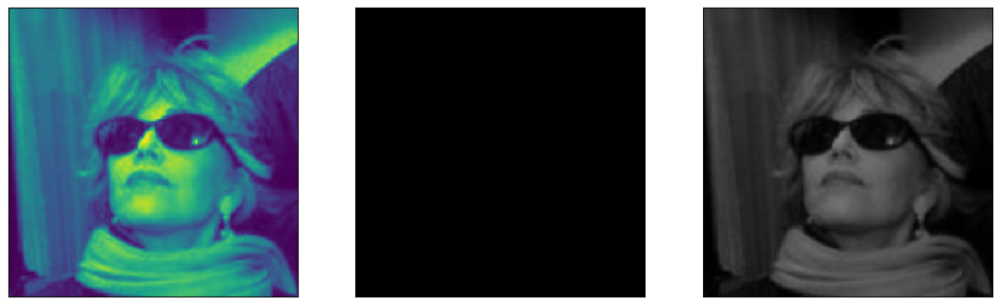

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
Probabilidad clase female : 73.5%
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
Probabilidad clase male: 26.5%





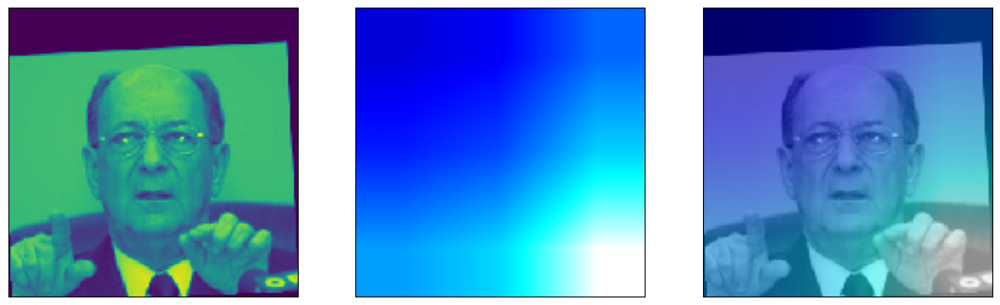

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
Probabilidad clase female : 0.1%
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
Probabilidad clase male: 99.9%





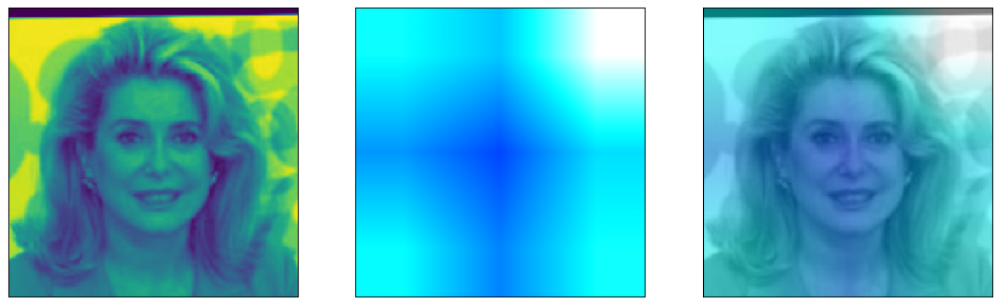

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
Probabilidad clase female : 100.0%
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
Probabilidad clase male: 0.0%





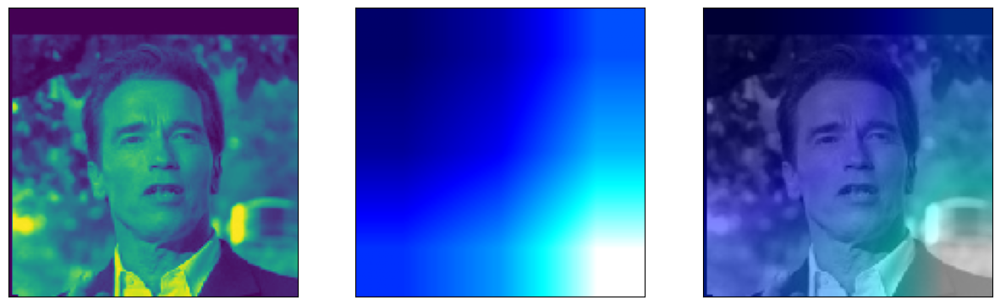

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
Probabilidad clase female : 0.2%
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
Probabilidad clase male: 99.8%





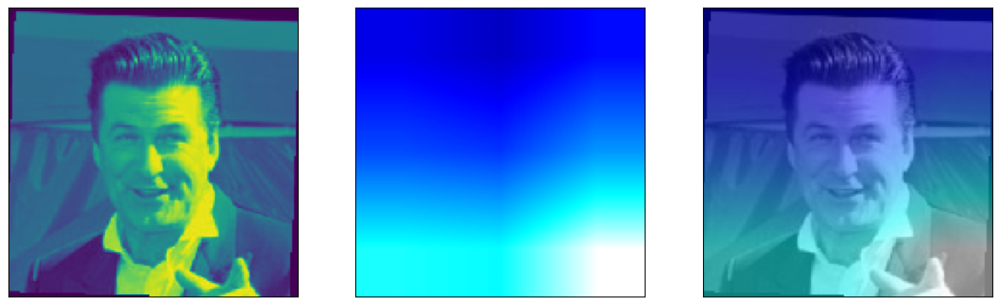

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
Probabilidad clase female : 0.2%
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
Probabilidad clase male: 99.8%





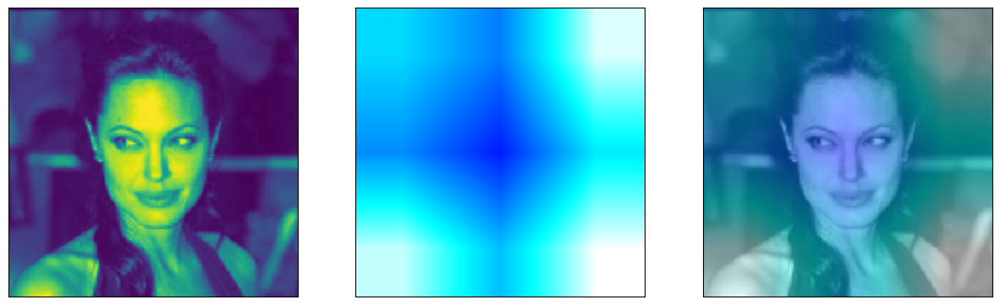

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
Probabilidad clase female : 100.0%
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
Probabilidad clase male: 0.0%





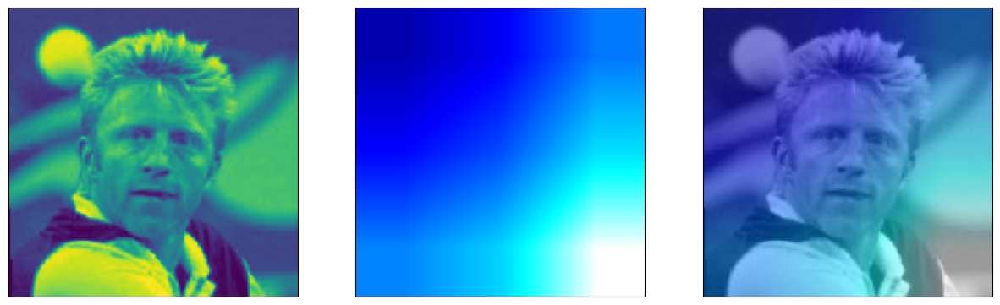

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
Probabilidad clase female : 0.0%
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
Probabilidad clase male: 100.0%





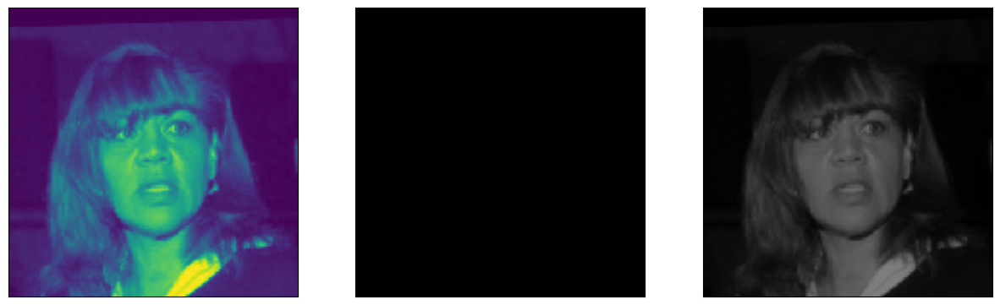

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
Probabilidad clase female : 98.0%
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
Probabilidad clase male: 2.0%





In [42]:
if best == color:
    for _ in range(20):
        ind = np.random.randint(len(X_te))
        show_heatmap(color, X_te[ind])
else:
    for _ in range(20):
        ind = np.random.randint(len(X_te))
        show_heatmap(gray, X_te[ind])